<a href="https://colab.research.google.com/github/rabnawaz172/Mushrrom/blob/main/Mush_1_display.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

dataset_dir = '/content/drive/My Drive/Mushroom/data/acd'

Class: Phallus_indusiatus, Image: Phallus_indusiatus58.png, Original Size: (218, 231)


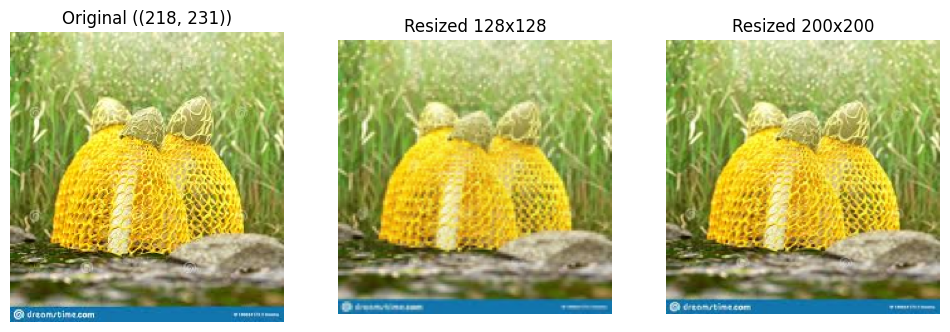

Class: Suillus_tomentosus, Image: Suillus_tomentosus6.png, Original Size: (100, 100)


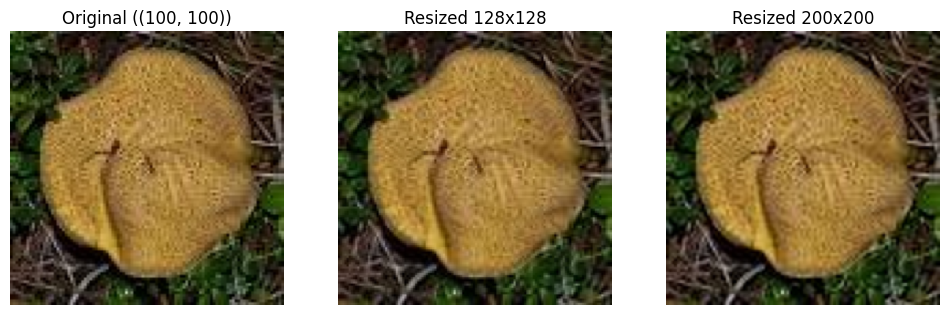

Class: Auricularia_auricula-judae, Image: Auricularia_auricula-judae34.png, Original Size: (217, 232)


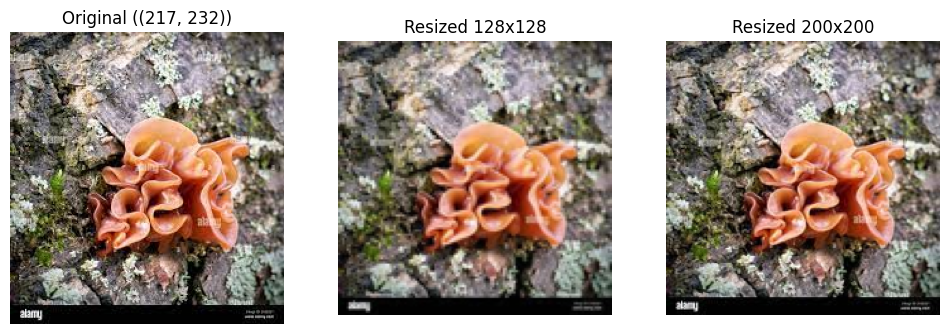

Class: Amanita_muscaria, Image: Amanita_muscaria35.png, Original Size: (275, 183)


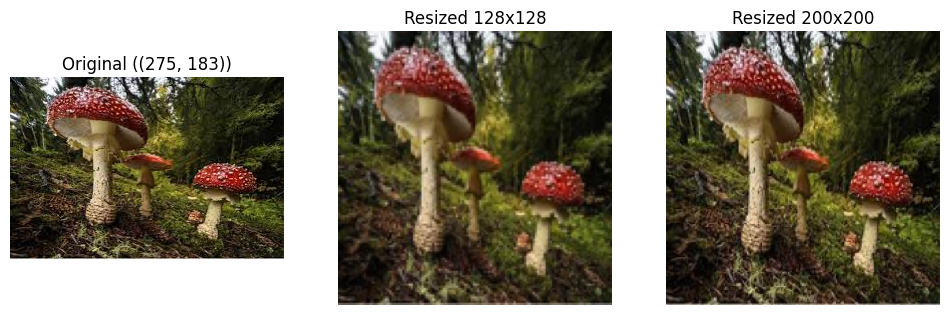

Class: Amanita_velatipes, Image: Amanita_velatipes1.png, Original Size: (100, 100)


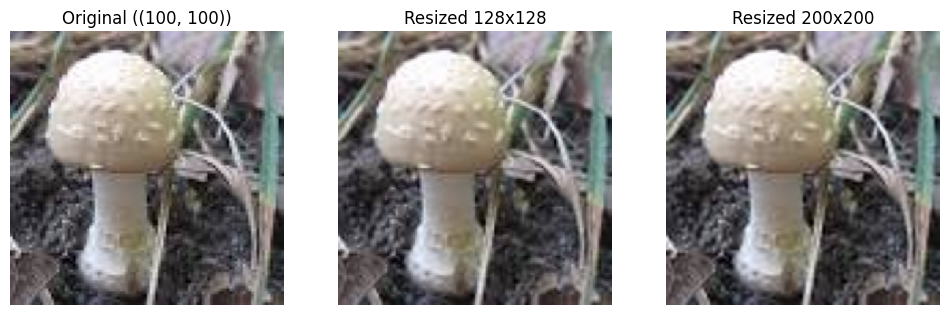

Class: Coprinellus_micaceus, Image: Coprinellus_micaceus3.png, Original Size: (100, 100)


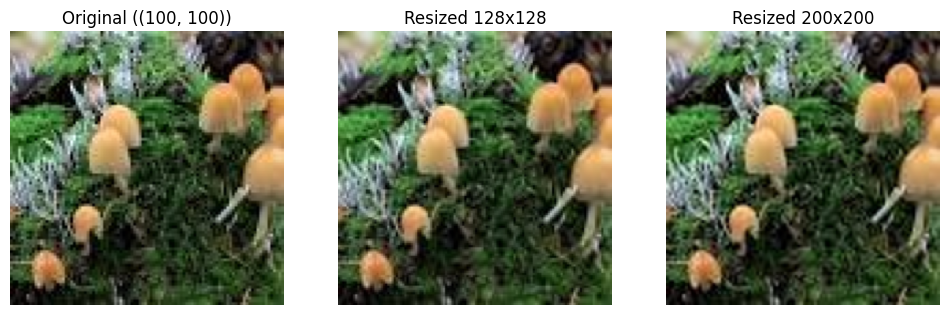

Class: Morchella_esculenta, Image: Morchella_esculenta62.png, Original Size: (275, 183)


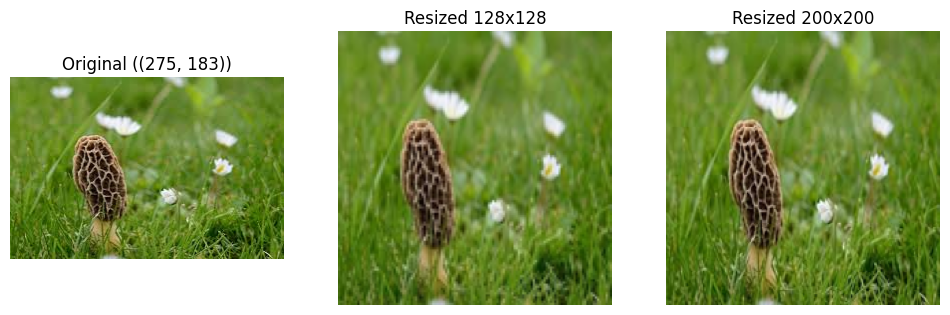

Class: Amanita_eliae, Image: Amanita_eliae9.png, Original Size: (100, 100)


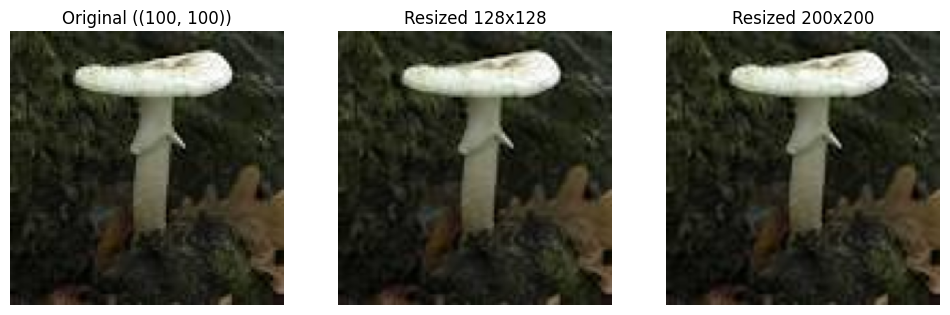

Class: Helvella_lacunosa, Image: Helvella_lacunosa3.png, Original Size: (100, 100)


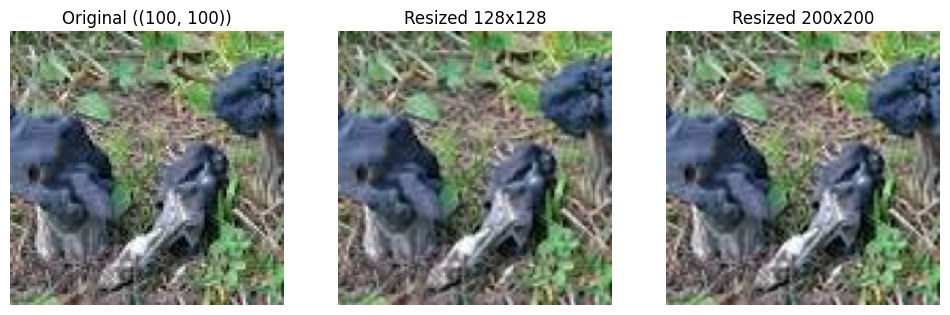

Class: Amanita_boudieri, Image: Amanita_boudieri7.png, Original Size: (100, 100)


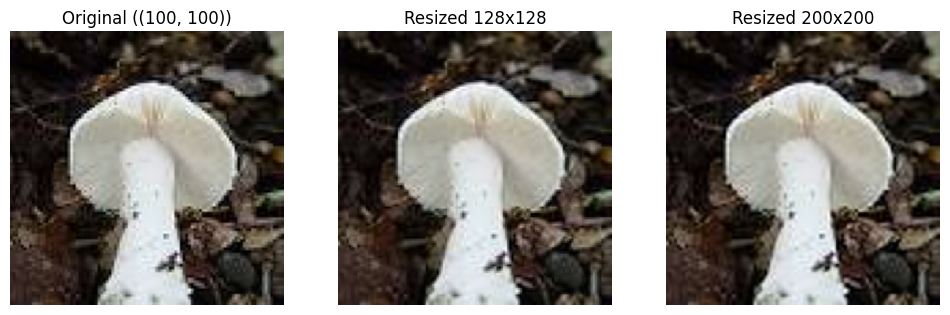

Class: Amanita_flavorubescens, Image: Amanita_flavorubescens16.png, Original Size: (265, 190)


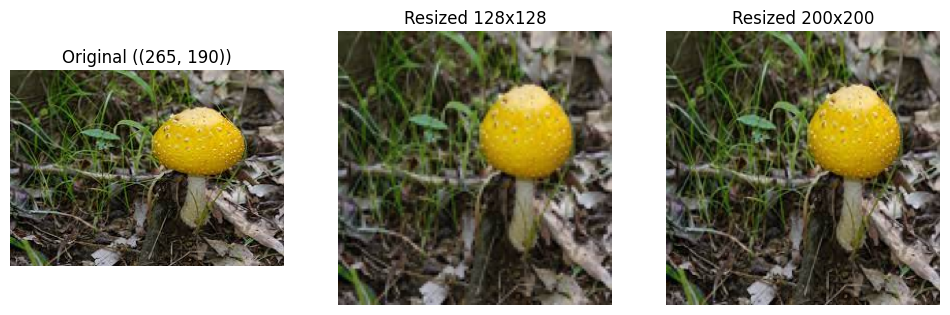

Class: Agaricus_arvensis, Image: Agaricus_arvensis16.png, Original Size: (100, 100)


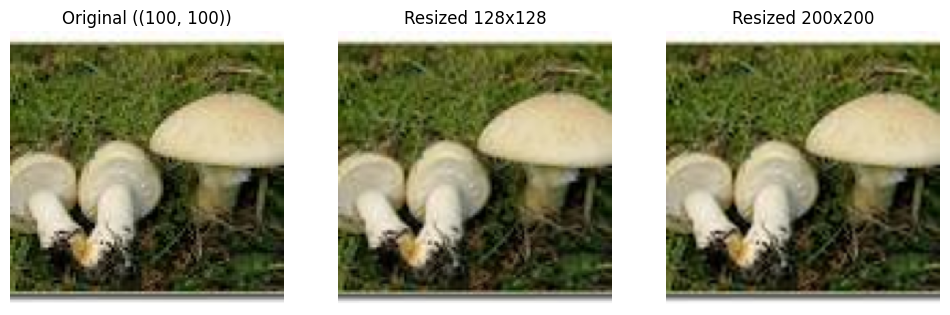

Class: Cortinarius_cinnamomeoluteus, Image: Cortinarius_cinnamomeoluteus18.png, Original Size: (244, 206)


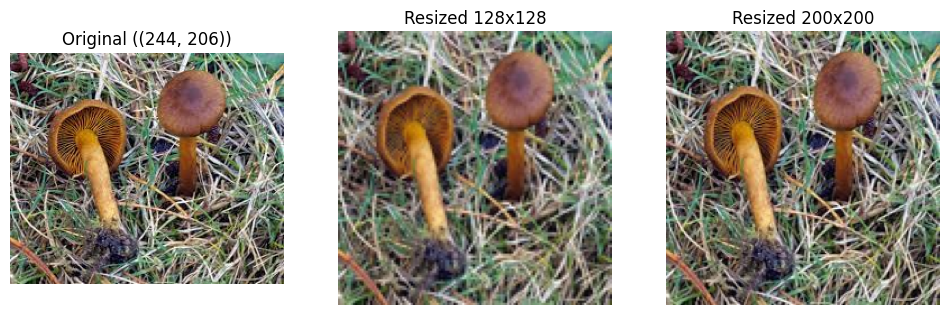

Class: Coprinus_comatus, Image: Coprinus_comatus24.png, Original Size: (259, 194)


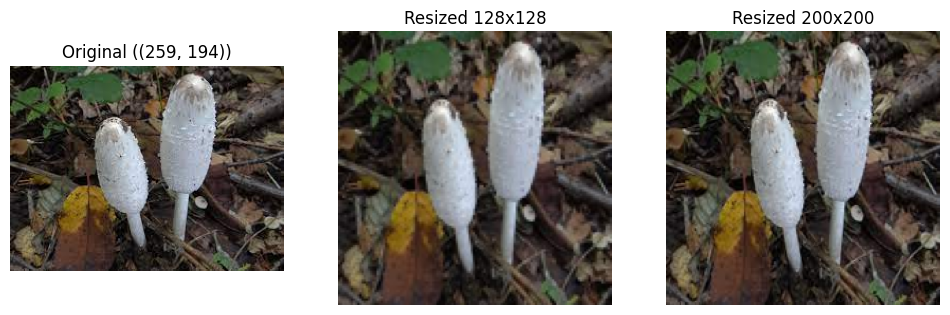

Class: Amanita_parcivolvata, Image: Amanita_parcivolvata5.png, Original Size: (100, 100)


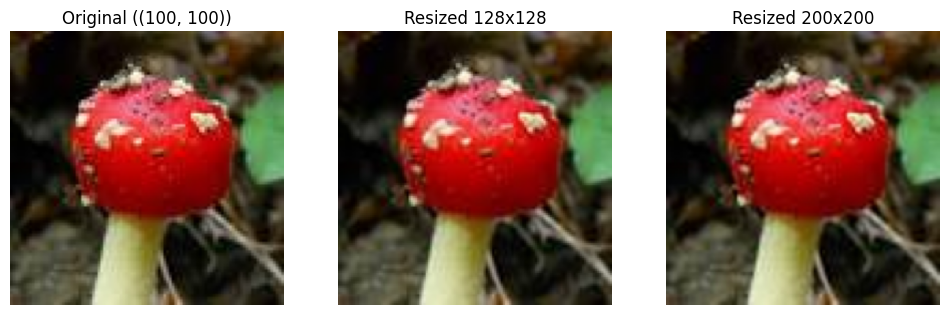

Class: Calocera_viscosa, Image: Calocera_viscosa25.png, Original Size: (259, 194)


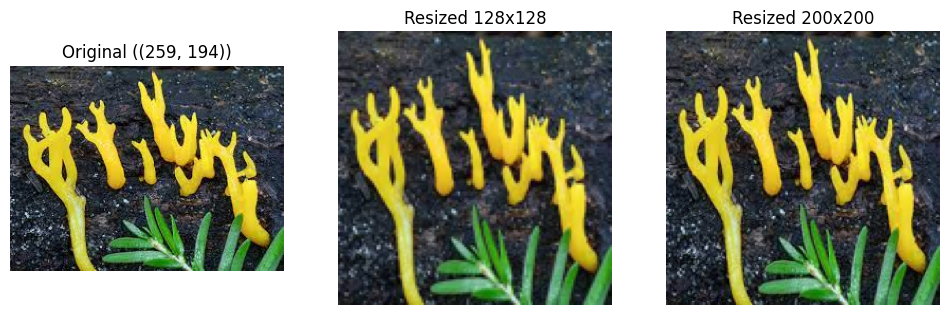

Class: Pholiotina_rugosa, Image: Pholiotina_rugosa12.png, Original Size: (275, 183)


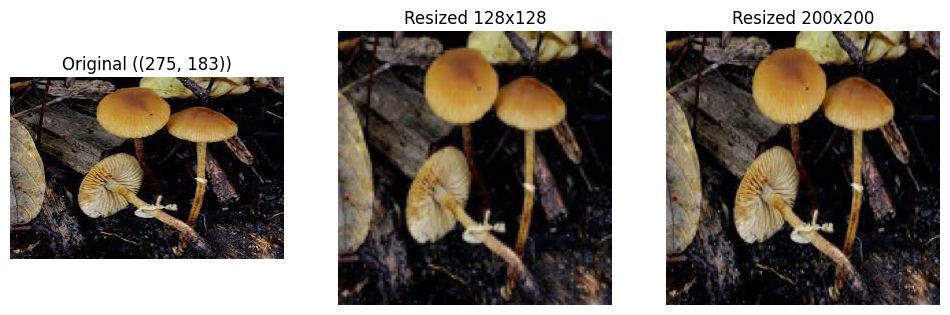

Class: Leccinum_versipelle, Image: Leccinum_versipelle5.png, Original Size: (100, 100)


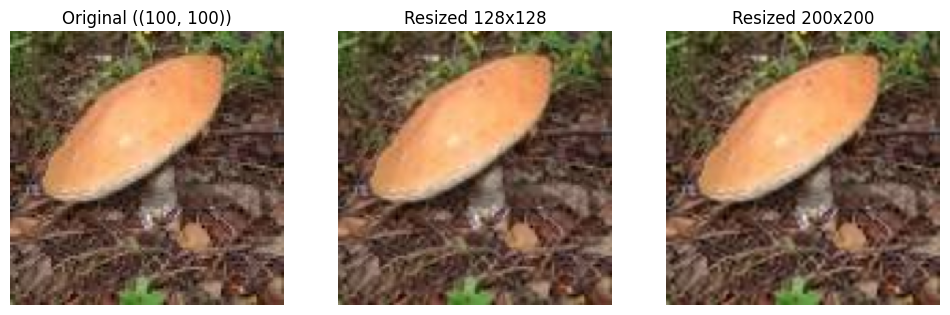

Class: Amanita_wellsii, Image: Amanita_wellsii13.png, Original Size: (245, 206)


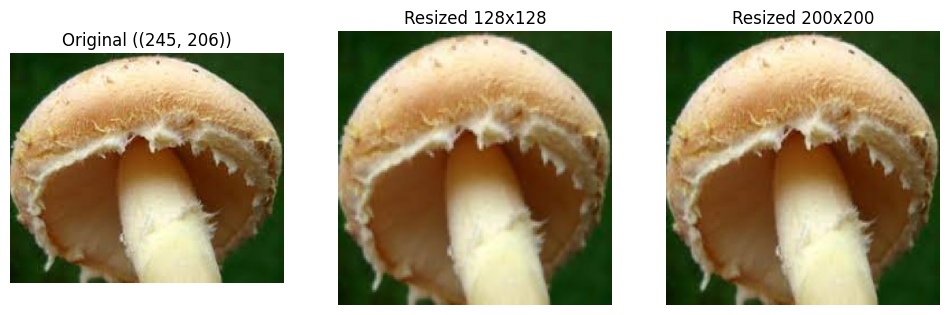

Class: Clavariaceae, Image: Clavariaceae21.png, Original Size: (300, 168)


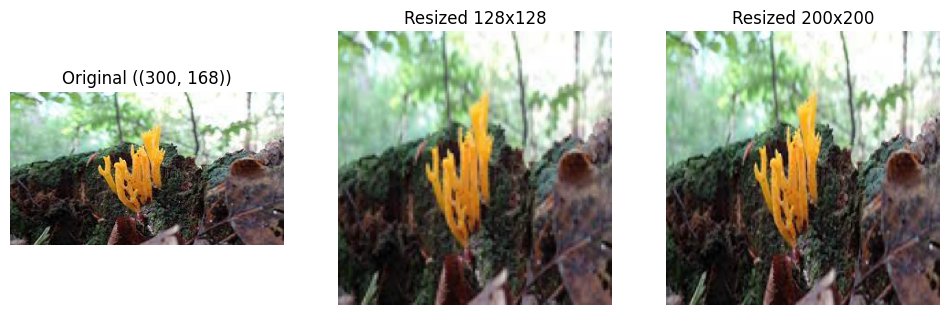

In [ ]:
import os
import random
from PIL import Image
import os
import numpy as np
import random
from PIL import Image
import matplotlib.pyplot as plt
import random
from PIL import Image
import matplotlib.pyplot as plt
# Get all class folders (subdirectories)
# Get all class folders (subdirectories)
classes = [f for f in os.listdir(dataset_dir) if os.path.isdir(os.path.join(dataset_dir, f))]

# Randomly select 20 classes
random_classes = random.sample(classes, 20)

# Function to resize images
def resize_image(image_path, size):
    """Resize image to the specified size and return it."""
    with Image.open(image_path) as img:
        resized_image = img.resize(size)
        return resized_image

# Loop through each selected class
for class_name in random_classes:
    class_path = os.path.join(dataset_dir, class_name)

    # Get all image files in the class directory
    images = [img for img in os.listdir(class_path) if img.endswith(('.png', '.jpg', '.jpeg'))]

    # Randomly select one image from the class
    random_image = random.choice(images)
    image_path = os.path.join(class_path, random_image)

    # Open the image and get its size
    with Image.open(image_path) as img:
        original_size = img.size  # Store (width, height) of the image
        print(f"Class: {class_name}, Image: {random_image}, Original Size: {original_size}")

        # Resize the image to 100x100 and 200x200
        resized_100x100 = resize_image(image_path, (128, 128))
        resized_200x200 = resize_image(image_path, (200, 200))

        # Normalize the images by scaling pixel values to [0, 1]
        resized_100x100 = resized_100x100.convert("RGB")  # Ensure it's in RGB mode
        resized_200x200 = resized_200x200.convert("RGB")
        resized_100x100 = (np.array(resized_100x100) / 255.0)
        resized_200x200 = (np.array(resized_200x200) / 255.0)

        # Display the original and resized images using matplotlib
        fig, axes = plt.subplots(1, 3, figsize=(12, 4))
        axes[0].imshow(img)
        axes[0].set_title(f'Original ({original_size})')

        axes[1].imshow(resized_100x100)
        axes[1].set_title('Resized 128x128')

        axes[2].imshow(resized_200x200)
        axes[2].set_title('Resized 200x200')

        # Hide axes and show the images
        for ax in axes:
            ax.axis('off')
        plt.show()

In [ ]:
pip install scipy

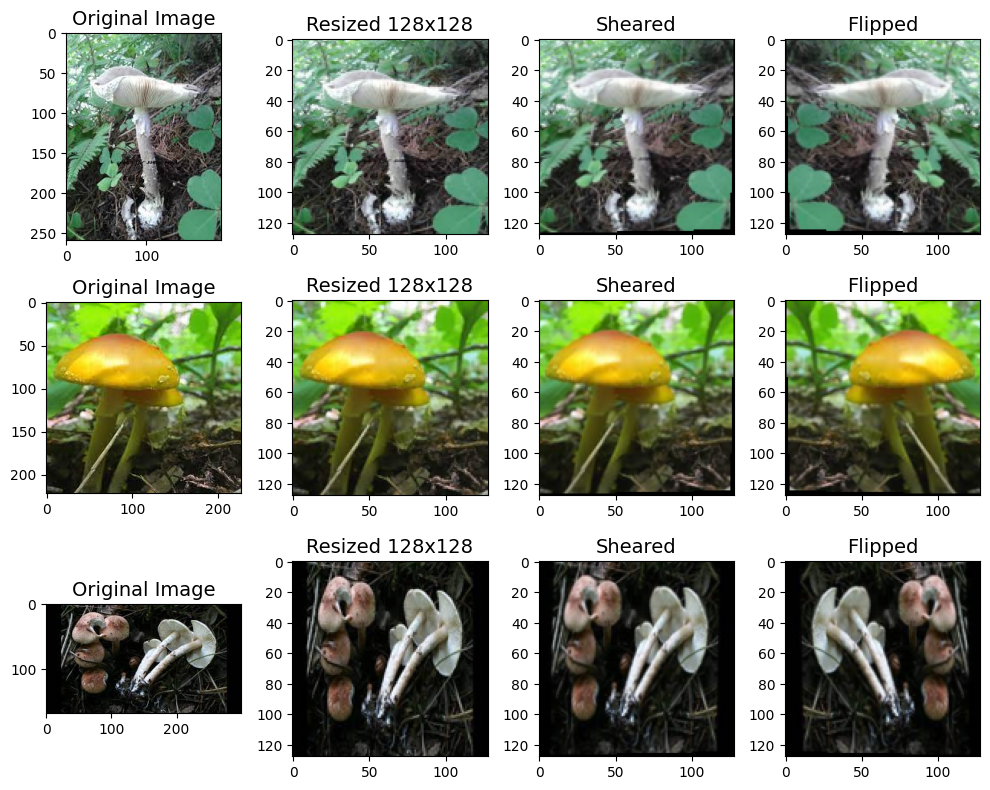

In [ ]:
import os
import random
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from scipy.ndimage import affine_transform
from IPython.display import display, Markdown

# Transformation parameters
shear_x = 0.02  # Shear amount along x-axis
shear_y = 0.02  # Shear amount along y-axis
zoom_range = 1  # Zoom amount
horizontal_flip = True  # Whether to apply horizontal flip

# Directory containing your dataset
dataset_dir = '/content/drive/My Drive/Mushroom/data/acd'

# Get all class folders (subdirectories)
classes = [f for f in os.listdir(dataset_dir) if os.path.isdir(os.path.join(dataset_dir, f))]

# Randomly select 5 classes
random_classes = random.sample(classes, 3)

# Function to resize images
def resize_image(image_path, size):
    """Resize image to the specified size and return it as a numpy array."""
    with Image.open(image_path) as img:
        resized_image = img.resize(size)
        return np.array(resized_image)

# Function to apply shear transformation
def shear_image(image_array, shear_x, shear_y):
    """Apply shear transformation to the image along x and y axes."""
    shear_matrix = np.array([[1, shear_x, 0], [shear_y, 1, 0], [0, 0, 1]])
    sheared_image = np.zeros_like(image_array)
    for i in range(image_array.shape[2]):
        sheared_image[:, :, i] = affine_transform(image_array[:, :, i], shear_matrix[:2, :2], order=1, mode='constant', cval=0)
    return sheared_image

# Function to apply horizontal flip
def flip_image(image_array):
    """Apply horizontal flip to the image."""
    return np.flip(image_array, axis=1)

# Prepare to plot images in a single figure
fig, axes = plt.subplots(3, 4, figsize=(10,8))
axes = axes.flatten()

# Loop through each selected class
for i, class_name in enumerate(random_classes):
    class_path = os.path.join(dataset_dir, class_name)

    # Get all image files in the class directory
    images = [img for img in os.listdir(class_path) if img.endswith(('.png', '.jpg', '.jpeg'))]

    # Randomly select one image from the class
    random_image = random.choice(images)
    image_path = os.path.join(class_path, random_image)

    # Open the image and get its size
    with Image.open(image_path) as img:
        original_image = np.array(img) / 255.0  # Normalize original image to [0, 1]

        # Resize the image to 128x128
        resized_128x128 = resize_image(image_path, (128, 128)) / 255.0  # Normalize resized image

        # Apply shear transformation
        sheared_image = shear_image(resized_128x128, shear_x, shear_y)

        # Apply horizontal flip if specified
        if horizontal_flip:
            flipped_image = flip_image(sheared_image)
        else:
            flipped_image = sheared_image

        # Display the images in one row
        images_to_show = [original_image, resized_128x128, sheared_image, flipped_image]
        titles = ['Original Image', 'Resized 128x128', 'Sheared', 'Flipped']

        for j in range(4):
            ax = axes[i * 4 + j]
            ax.imshow(images_to_show[j])
            ax.set_title(titles[j], fontsize=14)
            ax.axis('on')

plt.tight_layout()
plt.savefig('/content/drive/My Drive/Mushroom/processed_images.png')  # Save the figure to Google Drive
plt.show()


## Phallus_indusiatus

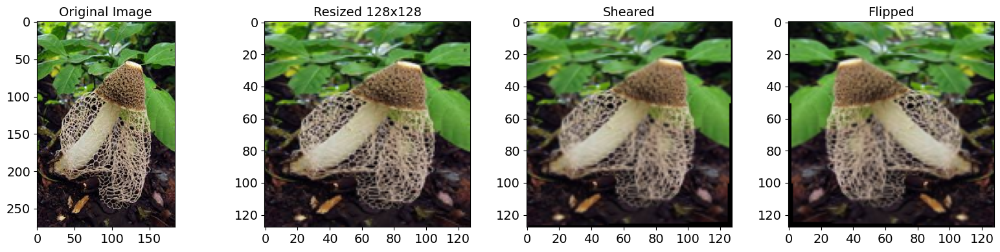

## Russula_emetica

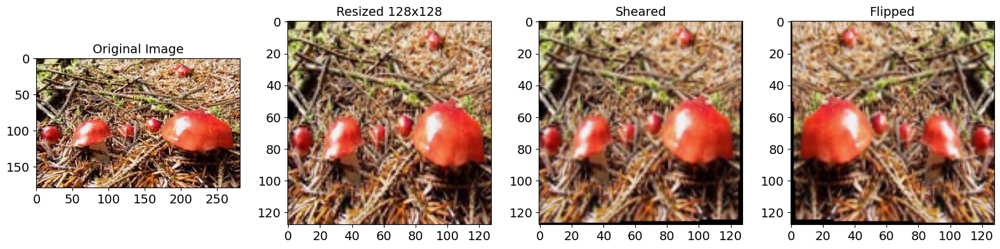

## Agaricus_silvaticus

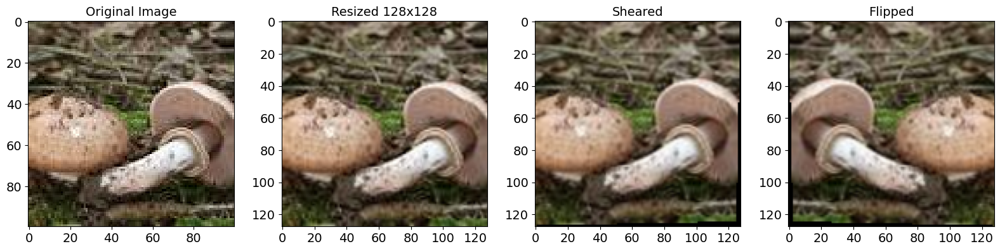

## Amanita_pseudoporphyria

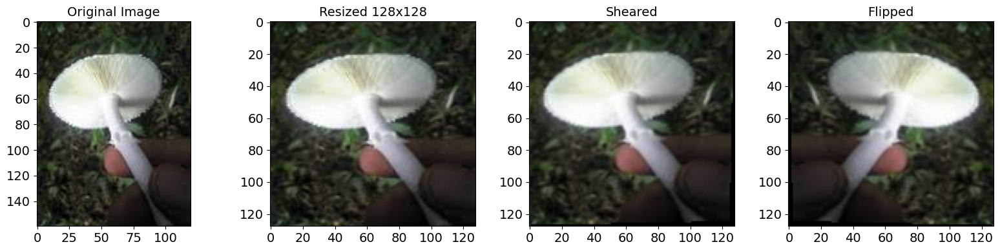

## Mycena_diosma

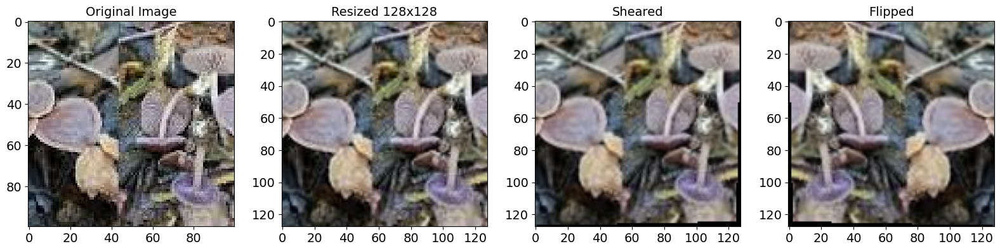

In [ ]:
import os
import random
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from scipy.ndimage import affine_transform
from IPython.display import display, Markdown

# Transformation parameters
shear_x = 0.02  # Shear amount along x-axis
shear_y = 0.02  # Shear amount along y-axis
zoom_range = 1  # Zoom amount
horizontal_flip = True  # Whether to apply horizontal flip

# Get all class folders (subdirectories)
classes = [f for f in os.listdir(dataset_dir) if os.path.isdir(os.path.join(dataset_dir, f))]

# Randomly select 5 classes
random_classes = random.sample(classes, 5)

# Function to resize images
def resize_image(image_path, size):
    """Resize image to the specified size and return it as a numpy array."""
    with Image.open(image_path) as img:
        resized_image = img.resize(size)
        return np.array(resized_image)

# Function to apply shear transformation
def shear_image(image_array, shear_x, shear_y):
    """Apply shear transformation to the image along x and y axes."""
    shear_matrix = np.array([[1, shear_x, 0], [shear_y, 1, 0], [0, 0, 1]])
    sheared_image = np.zeros_like(image_array)
    for i in range(image_array.shape[2]):
        sheared_image[:, :, i] = affine_transform(image_array[:, :, i], shear_matrix[:2, :2], order=1, mode='constant', cval=0)
    return sheared_image

# Function to apply horizontal flip
def flip_image(image_array):
    """Apply horizontal flip to the image."""
    return np.flip(image_array, axis=1)

# Loop through each selected class
for class_name in random_classes:
    class_path = os.path.join(dataset_dir, class_name)

    # Get all image files in the class directory
    images = [img for img in os.listdir(class_path) if img.endswith(('.png', '.jpg', '.jpeg'))]

    # Randomly select one image from the class
    random_image = random.choice(images)
    image_path = os.path.join(class_path, random_image)

    # Open the image and get its size
    with Image.open(image_path) as img:
        original_image = np.array(img) / 255.0  # Normalize original image to [0, 1]


        display(Markdown(f"## {class_name}"))

        # Resize the image to 128x128
        resized_128x128 = resize_image(image_path, (128, 128)) / 255.0  # Normalize resized image

        # Apply shear transformation
        sheared_image = shear_image(resized_128x128, shear_x, shear_y)

        # Apply horizontal flip if specified
        if horizontal_flip:
            flipped_image = flip_image(sheared_image)

        # Display the original, resized, sheared, and flipped images
        plt.figure(figsize=(16, 4))
        tick_font_size = 14
        plt.subplot(1, 4, 1)
        plt.imshow(original_image)
        plt.title('Original Image', fontsize=14)
        plt.xticks(fontsize=tick_font_size)
        plt.yticks(fontsize=tick_font_size)

        plt.axis('on')

        plt.subplot(1, 4, 2)
        plt.imshow(resized_128x128)
        plt.title('Resized 128x128', fontsize=14)
        plt.xticks(fontsize=tick_font_size)
        plt.yticks(fontsize=tick_font_size)

        plt.axis('on')

        plt.subplot(1, 4, 3)
        plt.imshow(sheared_image)
        plt.title('Sheared', fontsize=14)
        plt.xticks(fontsize=tick_font_size)
        plt.yticks(fontsize=tick_font_size)

        plt.axis('on')

        plt.subplot(1, 4, 4)
        plt.imshow(flipped_image)
        plt.title('Flipped', fontsize=14)
        plt.xticks(fontsize=tick_font_size)
        plt.yticks(fontsize=tick_font_size)

        plt.axis('on')

        plt.tight_layout()
        plt.show()


In [ ]:
data_dir = '/content/drive/My Drive/Mushroom/data/acd'

Found 3513 images belonging to 103 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/60


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


110/110 ━━━━━━━━━━━━━━━━━━━━ 1234s 11s/step - accuracy: 0.0126 - loss: 4.6268 - val_accuracy: 0.0342 - val_loss: 4.3039
Epoch 2/60
110/110 ━━━━━━━━━━━━━━━━━━━━ 242s 2s/step - accuracy: 0.0572 - loss: 4.2378 - val_accuracy: 0.1076 - val_loss: 3.8498
Epoch 3/60
110/110 ━━━━━━━━━━━━━━━━━━━━ 189s 2s/step - accuracy: 0.1025 - loss: 3.8388 - val_accuracy: 0.1782 - val_loss: 3.4037
Epoch 4/60
110/110 ━━━━━━━━━━━━━━━━━━━━ 186s 2s/step - accuracy: 0.1924 - loss: 3.3460 - val_accuracy: 0.2699 - val_loss: 2.9359
Epoch 5/60
110/110 ━━━━━━━━━━━━━━━━━━━━ 203s 2s/step - accuracy: 0.2787 - loss: 2.9085 - val_accuracy: 0.3601 - val_loss: 2.5484
Epoch 6/60
110/110 ━━━━━━━━━━━━━━━━━━━━ 214s 2s/step - accuracy: 0.3393 - loss: 2.5878 - val_accuracy: 0.4039 - val_loss: 2.3505
Epoch 7/60
110/110 ━━━━━━━━━━━━━━━━━━━━ 234s 2s/step - accuracy: 0.3990 - loss: 2.3233 - val_accuracy: 0.4611 - val_loss: 2.0884
Epoch 8/60
110/110 ━━━━━━━━━━━━━━━━━━━━ 187s 2s/step - accuracy: 0.4617 - loss: 2.0673 - val_accuracy: 0.5

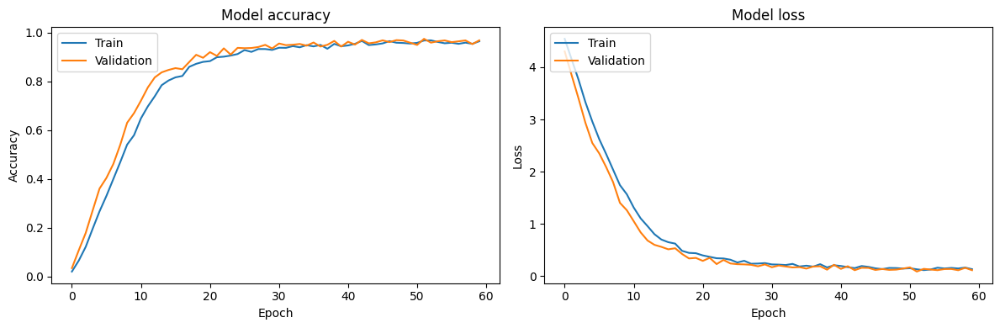

Found 3513 images belonging to 103 classes.
110/110 ━━━━━━━━━━━━━━━━━━━━ 70s 631ms/step

Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.95      0.96        39
           1       0.97      0.94      0.95        31
           2       0.96      0.96      0.96        28
           3       0.96      0.93      0.95        28
           4       0.96      1.00      0.98        43
           5       1.00      1.00      1.00        20
           6       1.00      0.97      0.98        32
           7       0.97      0.97      0.97        30
           8       0.97      0.94      0.95        31
           9       1.00      1.00      1.00        25
          10       1.00      0.97      0.99        35
          11       1.00      0.96      0.98        28
          12       1.00      1.00      1.00        51
          13       1.00      0.93      0.96        27
          14       0.96      0.96      0.96        28
          15       0.9

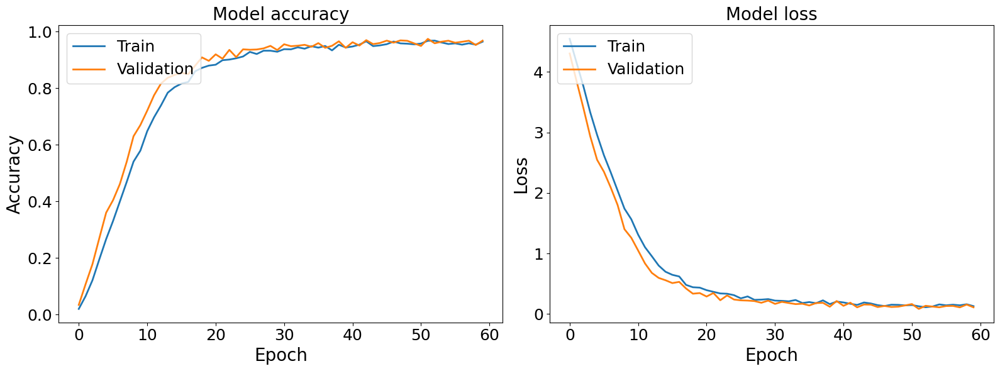

Found 3513 images belonging to 103 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


110/110 ━━━━━━━━━━━━━━━━━━━━ 55s 496ms/step

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        39
           1       1.00      0.94      0.97        31
           2       0.97      1.00      0.98        28
           3       0.93      0.96      0.95        28
           4       0.96      1.00      0.98        43
           5       0.95      1.00      0.98        20
           6       0.97      0.97      0.97        32
           7       1.00      1.00      1.00        30
           8       0.97      0.94      0.95        31
           9       0.93      1.00      0.96        25
          10       1.00      0.94      0.97        35
          11       0.96      0.86      0.91        28
          12       0.98      0.96      0.97        51
          13       1.00      0.89      0.94        27
          14       1.00      1.00      1.00        28
          15       0.97      1.00      0.98        31
          16

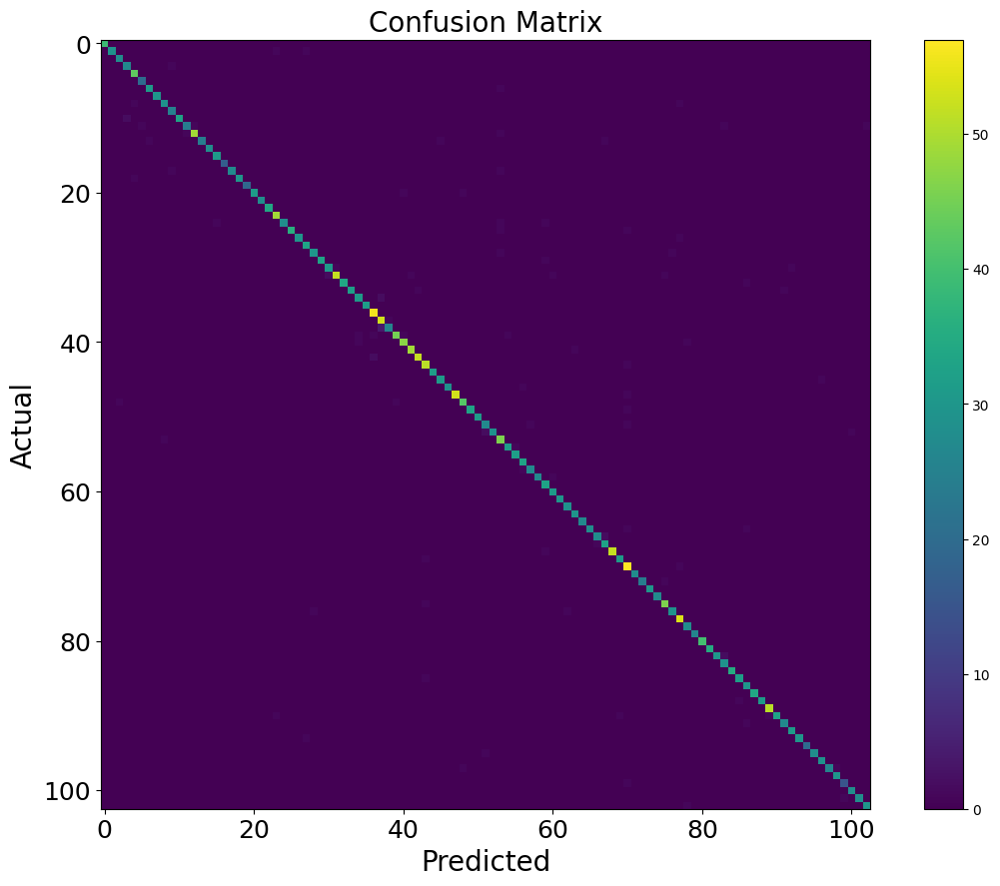

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt

# Set your data directory


# Define parameters
batch_size = 32
image_size = (128, 128)  # Adjust the image size as needed

# Create ImageDataGenerator for training (with validation)
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2,
)

train_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical'
)

# Build the CNN model
model = Sequential()

model.add(Conv2D(32, (3, 3), input_shape=(image_size[0], image_size[1], 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dense(len(train_generator.class_indices), activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model with the same data for training and validation
epochs = 60  # Adjust the number of epochs as needed

history = model.fit(
    train_generator,
    epochs=epochs,
    validation_data=train_generator  # Use the same data for validation
)

# Save the trained model
model.save('/content/drive/My Drive/Mushroom/mushroom_model1.h5')



# Plot accuracy and loss curves
plt.figure(figsize=(12, 4))

# Plot training & validation accuracy values
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])  # Validation accuracy plot
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()

# Evaluate the model and print classification report and confusion matrix
eval_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

y_true = eval_generator.classes
y_pred = model.predict(eval_generator)

# Convert predictions to class labels
y_pred_classes = tf.argmax(y_pred, axis=1)

# Print classification report
print("\nClassification Report:\n", classification_report(y_true, y_pred_classes))
# Plot training & validation accuracy values
plt.figure(figsize=(16, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], linewidth=2)
plt.plot(history.history['val_accuracy'], linewidth=2)  # Validation accuracy plot
plt.title('Model accuracy', fontsize=20)
plt.xlabel('Epoch', fontsize=20)
plt.ylabel('Accuracy', fontsize=20)
plt.legend(['Train', 'Validation'], loc='upper left', fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], linewidth=2)
plt.plot(history.history['val_loss'], linewidth=2)
plt.title('Model loss', fontsize=20)
plt.xlabel('Epoch', fontsize=20)
plt.ylabel('Loss', fontsize=20)
plt.legend(['Train', 'Validation'], loc='upper left', fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

plt.tight_layout()
plt.show()

# Evaluate the model and print classification report and confusion matrix
eval_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

y_true = eval_generator.classes
y_pred = model.predict(eval_generator)

# Convert predictions to class labels
y_pred_classes = tf.argmax(y_pred, axis=1)

# Print classification report
print("\nClassification Report:\n", classification_report(y_true, y_pred_classes))

# Plot confusion matrix
conf_mat = confusion_matrix(y_true, y_pred_classes)
plt.figure(figsize=(14, 10))
plt.imshow(conf_mat, cmap='viridis')
plt.colorbar()
plt.title('Confusion Matrix', fontsize=20)
plt.xlabel('Predicted', fontsize=20)
plt.ylabel('Actual', fontsize=20)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()

# Save the model in Keras format
model.save("/content/gdrive/mydrive/mymodel/_model.h5")

In [ ]:
model.save("/content/drive/My Drive/Mushroom/Mushroom_model_09.h5")

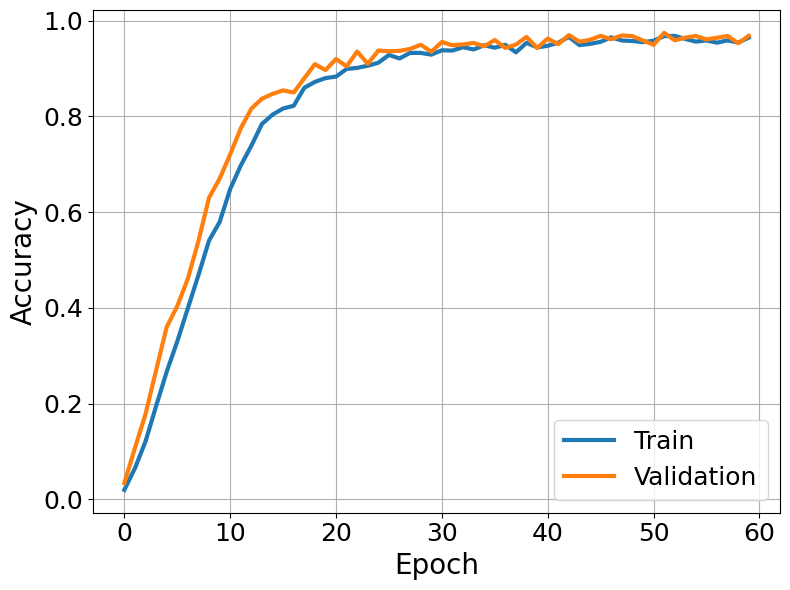

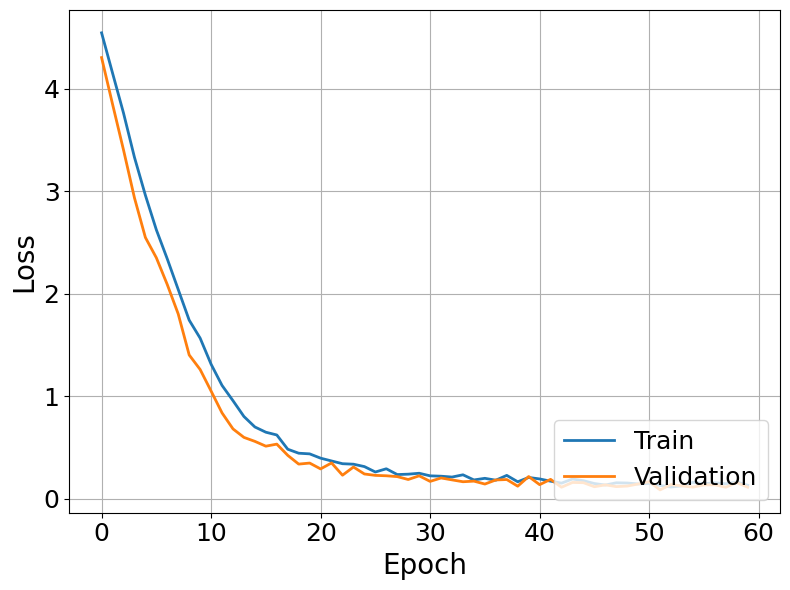

In [ ]:
plt.figure(figsize=(8, 6))


plt.plot(history.history['accuracy'], linewidth=3)
plt.plot(history.history['val_accuracy'], linewidth=3)  # Validation accuracy plot

plt.xlabel('Epoch', fontsize=20)
plt.ylabel('Accuracy', fontsize=20)
plt.legend(['Train', 'Validation'], loc='lower right', fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.grid(True)
plt.tight_layout()
plt.show()


# Plot training & validation loss values
plt.figure(figsize=(8, 6))
plt.plot(history.history['loss'], linewidth=2)
plt.plot(history.history['val_loss'], linewidth=2)
plt.xlabel('Epoch', fontsize=20)
plt.ylabel('Loss', fontsize=20)
plt.legend(['Train', 'Validation'], loc='lower right', fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.grid(True)
plt.tight_layout()
plt.show()


110/110 ━━━━━━━━━━━━━━━━━━━━ 56s 501ms/step

Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.90      0.92        39
           1       1.00      1.00      1.00        31
           2       1.00      1.00      1.00        28
           3       0.93      0.96      0.95        28
           4       0.93      1.00      0.97        43
           5       0.95      1.00      0.98        20
           6       0.94      1.00      0.97        32
           7       1.00      1.00      1.00        30
           8       1.00      0.94      0.97        31
           9       0.96      1.00      0.98        25
          10       1.00      0.94      0.97        35
          11       1.00      0.96      0.98        28
          12       0.98      1.00      0.99        51
          13       1.00      0.89      0.94        27
          14       0.96      0.96      0.96        28
          15       0.94      1.00      0.97        31
          16

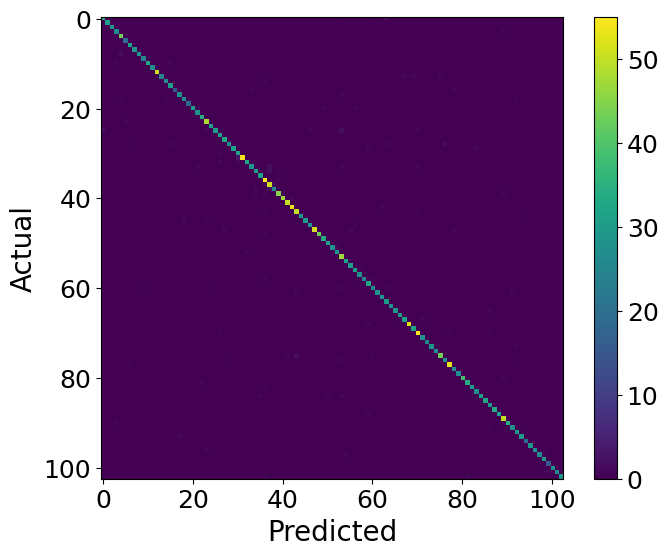

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
import tensorflow as tf

# Assuming y_true and y_pred are already defined as follows
y_true = eval_generator.classes
y_pred = model.predict(eval_generator)

# Convert predictions to class labels
y_pred_classes = tf.argmax(y_pred, axis=1).numpy()  # Ensure it's converted to NumPy array

# Print classification report
print("\nClassification Report:\n", classification_report(y_true, y_pred_classes))

# Compute confusion matrix
conf_mat = confusion_matrix(y_true, y_pred_classes)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
plt.imshow(conf_mat, cmap='viridis')
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=18)  #
# Customize the color bar ticks
 # Set ticks based on confusion matrix values

# Customize axis labels and ticks
plt.xlabel('Predicted', fontsize=20)
plt.ylabel('Actual', fontsize=20)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
import tensorflow as tf

# Assuming y_true and y_pred_classes are already defined
y_true = eval_generator.classes
y_pred = model.predict(eval_generator)

# Convert predictions to class labels
y_pred_classes = tf.argmax(y_pred, axis=1).numpy()  # Ensure it's converted to NumPy array

# Obtain the class labels from the generator
class_labels = list(eval_generator.class_indices.keys())

# Generate and print the classification report with class labels, setting decimal points to 5
print("\nClassification Report:\n", classification_report(y_true, y_pred_classes, target_names=class_labels, digits=5))


110/110 ━━━━━━━━━━━━━━━━━━━━ 58s 518ms/step

Classification Report:
                               precision    recall  f1-score   support

           Agaricus_arvensis    1.00000   1.00000   1.00000        39
         Agaricus_silvaticus    1.00000   0.96774   0.98361        31
            Aleuria_aurantia    1.00000   1.00000   1.00000        28
            Amanita_boudieri    0.93103   0.96429   0.94737        28
            Amanita_caesarea    0.91489   1.00000   0.95556        43
              Amanita_cokeri    0.95000   0.95000   0.95000        20
       Amanita_echinocephala    0.94118   1.00000   0.96970        32
               Amanita_eliae    0.93548   0.96667   0.95082        30
          Amanita_flavoconia    1.00000   0.96774   0.98361        31
      Amanita_flavorubescens    0.95833   0.92000   0.93878        25
           Amanita_gracilior    1.00000   0.85714   0.92308        35
              Amanita_hongoi    0.96296   0.92857   0.94545        28
            Amanita_

In [ ]:
from sklearn.metrics import classification_report

# Obtain class labels from the generator
class_labels = list(eval_generator.class_indices.keys())

# Generate classification report with class labels
print("\nClassification Report:\n", classification_report(y_true, y_pred_classes, target_names=class_labels))


Classification Report:
                               precision    recall  f1-score   support

           Agaricus_arvensis       0.97      1.00      0.99        39
         Agaricus_silvaticus       0.97      0.97      0.97        31
            Aleuria_aurantia       1.00      1.00      1.00        28
            Amanita_boudieri       0.93      0.93      0.93        28
            Amanita_caesarea       0.98      1.00      0.99        43
              Amanita_cokeri       0.95      1.00      0.98        20
       Amanita_echinocephala       0.97      1.00      0.98        32
               Amanita_eliae       0.97      1.00      0.98        30
          Amanita_flavoconia       1.00      0.94      0.97        31
      Amanita_flavorubescens       1.00      1.00      1.00        25
           Amanita_gracilior       0.97      0.86      0.91        35
              Amanita_hongoi       0.96      0.96      0.96        28
            Amanita_muscaria       0.98      0.94      0.96     


Classification Report:
                               precision    recall  f1-score   support

           Agaricus_arvensis    1.00000   0.97436   0.98701        39
         Agaricus_silvaticus    0.96667   0.93548   0.95082        31
            Aleuria_aurantia    0.96552   1.00000   0.98246        28
            Amanita_boudieri    0.92857   0.92857   0.92857        28
            Amanita_caesarea    0.91489   1.00000   0.95556        43
              Amanita_cokeri    0.95238   1.00000   0.97561        20
       Amanita_echinocephala    1.00000   0.96875   0.98413        32
               Amanita_eliae    0.96667   0.96667   0.96667        30
          Amanita_flavoconia    0.96774   0.96774   0.96774        31
      Amanita_flavorubescens    1.00000   0.96000   0.97959        25
           Amanita_gracilior    0.96875   0.88571   0.92537        35
              Amanita_hongoi    1.00000   0.92857   0.96296        28
            Amanita_muscaria    0.96078   0.96078   0.96078     

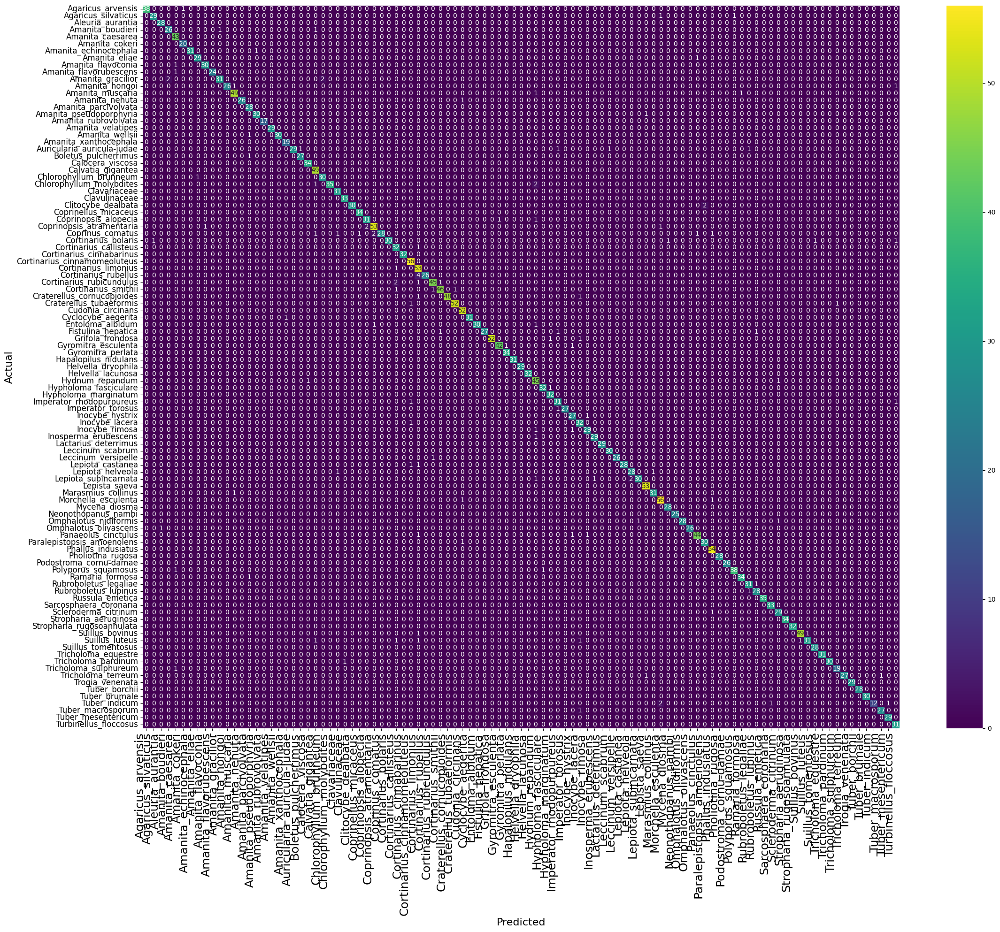

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix

# Obtain the class labels from the generator
class_labels = list(eval_generator.class_indices.keys())

# Generate and print the classification report with class labels, setting decimal points to 5
print("\nClassification Report:\n", classification_report(y_true, y_pred_classes, target_names=class_labels, digits=5))


import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix

# Obtain the class labels from the generator
class_labels = list(eval_generator.class_indices.keys())

# Generate and print the classification report with class labels
print("\nClassification Report:\n", classification_report(y_true, y_pred_classes, target_names=class_labels))

# Compute confusion matrix
conf_mat = confusion_matrix(y_true, y_pred_classes)

# Plot confusion matrix with class labels
plt.figure(figsize=(26, 20))
heatmap = sns.heatmap(conf_mat, annot=True, fmt='d', cmap='viridis',
                      xticklabels=class_labels, yticklabels=class_labels,
                      cbar_kws={"ticks": np.arange(0, conf_mat.max() + 1)})

# Customize labels and ticks
plt.xlabel('Predicted', fontsize=16)
plt.ylabel('Actual', fontsize=16)
plt.xticks(rotation=90, ha='right', fontsize=18)
plt.yticks(rotation=0, fontsize=12)

plt.show()



<ipython-input-88-6a06b4e75595>:45: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout(rect=[0, 0, 0.1, 1])  # Adjust space to fit the legend on the right


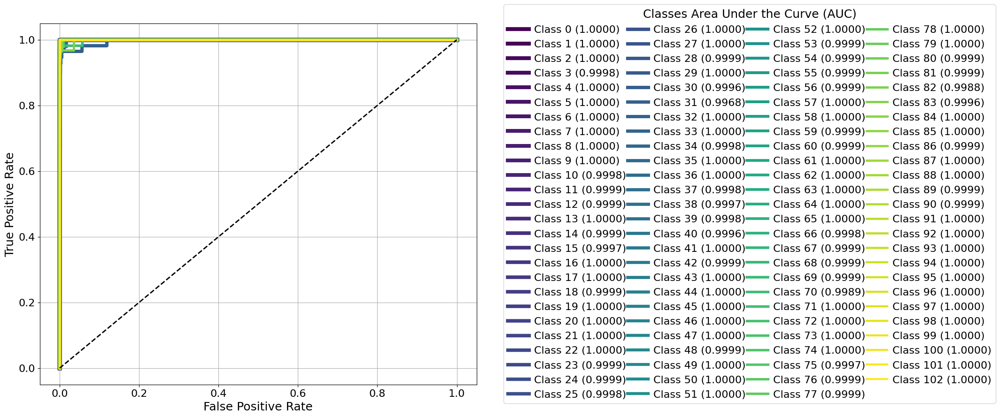

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle
import matplotlib.pyplot as plt
import numpy as np

# Binarize the labels for ROC curve calculation (One-vs-Rest)
y_true_bin = label_binarize(y_true, classes=range(len(class_labels)))
y_pred_bin = y_pred  # Assuming y_pred contains probability scores for each class

# Set up the plot for ROC curves
plt.figure(figsize=(12, 10))

# Generate 103 distinct colors using a colormap
colors = plt.cm.viridis(np.linspace(0, 1, len(class_labels)))

# Define line styles and widths for different classes
line_styles = ['-', '--', '-.', ':']  # Add more styles as needed
line_widths = np.linspace(1, 4, len(class_labels))  # Line widths from 1 to 4

# Plot ROC curve for each class
for i in range(len(class_labels)):
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_bin[:, i])
    roc_auc = auc(fpr, tpr)
    # Cycle through line styles based on index

    width = line_widths[i]  # Use different widths for each class
    plt.plot(fpr, tpr, color=colors[i], lw=7-width,  label=f"Class {i} ({roc_auc:.4f})")

# Plot diagonal line for reference
plt.plot([0, 1], [0, 1], 'k--', lw=2)

# Customize the plot
plt.xlabel('False Positive Rate', fontsize=18)
plt.ylabel('True Positive Rate', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.grid(True)

# Place legend on the right with 3 columns
plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5),
           fontsize=16, ncol=4, title="Classes Area Under the Curve (AUC)",
           title_fontsize=18, handletextpad=0.5, columnspacing=0.1)

plt.tight_layout(rect=[0, 0, 0.1, 1])  # Adjust space to fit the legend on the right
plt.show()



In [ ]:
from sklearn.metrics import classification_report

# Obtain class labels from the generator
class_labels = list(eval_generator.class_indices.keys())

# Generate classification report with class labels
print("\nClassification Report:\n", classification_report(y_true, y_pred_classes, target_names=class_labels))


Classification Report:
                               precision    recall  f1-score   support

           Agaricus_arvensis       1.00      0.95      0.97        39
         Agaricus_silvaticus       1.00      0.90      0.95        31
            Aleuria_aurantia       1.00      1.00      1.00        28
            Amanita_boudieri       0.78      1.00      0.88        28
            Amanita_caesarea       1.00      1.00      1.00        43
              Amanita_cokeri       1.00      0.95      0.97        20
       Amanita_echinocephala       0.97      1.00      0.98        32
               Amanita_eliae       1.00      0.93      0.97        30
          Amanita_flavoconia       1.00      0.97      0.98        31
      Amanita_flavorubescens       1.00      1.00      1.00        25
           Amanita_gracilior       0.97      0.80      0.88        35
              Amanita_hongoi       0.93      1.00      0.97        28
            Amanita_muscaria       0.98      0.98      0.98     

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_data_dir = '/content/drive/My Drive/Mushroom/data/acd'


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
import os

# Initialize ImageDataGenerator for rescaling images
test_datagen = ImageDataGenerator(rescale=1.0/255)

# Load all test data with the required target size, without shuffling to keep class order intact
test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical',
    shuffle=False  # Ensure image order remains for balanced sampling
)

# Number of samples to use per class
n_total_per_class = test_generator.samples // test_generator.num_classes
n_subset_per_class = int(0.2 * n_total_per_class)  # 20% per class

# Track selected images and labels
x_subset, y_subset = [], []
class_counts = {class_index: 0 for class_index in range(test_generator.num_classes)}

# Collect images for 20% of each class
for i in range(test_generator.samples):
    x, y = next(test_generator)  # Corrected line
    y_class = np.argmax(y, axis=1)[0]

    # Check if we've reached 20% for this class; if not, add to the subset
    if class_counts[y_class] < n_subset_per_class:
        x_subset.append(x[0])  # Add the image
        y_subset.append(y_class)  # Add the label
        class_counts[y_class] += 1

    # Stop once we have enough images for each class
    if all(count >= n_subset_per_class for count in class_counts.values()):
        break

# Convert lists to arrays
x_subset = np.array(x_subset)
y_true = np.array(y_subset)

# Predict class probabilities for the subset
y_pred_prob = model.predict(x_subset)

# Convert probabilities to predicted class labels
y_pred = np.argmax(y_pred_prob, axis=1)


Found 3513 images belonging to 103 classes.
18/18 ━━━━━━━━━━━━━━━━━━━━ 5s 252ms/step


In [ ]:
from tensorflow.keras.models import load_model
model = load_model('/content/drive/MyDrive/Mushroom/mushroom_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


110/110 ━━━━━━━━━━━━━━━━━━━━ 965s 9s/step


              precision    recall  f1-score   support

           0       0.00      0.00      0.00       6.0
           1       0.00      0.00      0.00       6.0
           2       0.00      0.00      0.00       6.0
           3       0.00      0.00      0.00       0.0
           4       0.00      0.00      0.00       6.0
           6       0.00      0.00      0.00       6.0
           7       0.00      0.00      0.00       6.0
           8       0.00      0.00      0.00       6.0
           9       0.00      0.00      0.00       6.0
          10       0.00      0.00      0.00       6.0
          11       0.00      0.00      0.00       6.0
          12       0.00      0.00      0.00       6.0
          13       0.00      0.00      0.00       0.0
          14       0.00      0.00      0.00       6.0
          15       0.00      0.00      0.00       6.0
          16       0.00      0.00      0.00       6.0
          17       0.00      0.00      0.00       6.0
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_

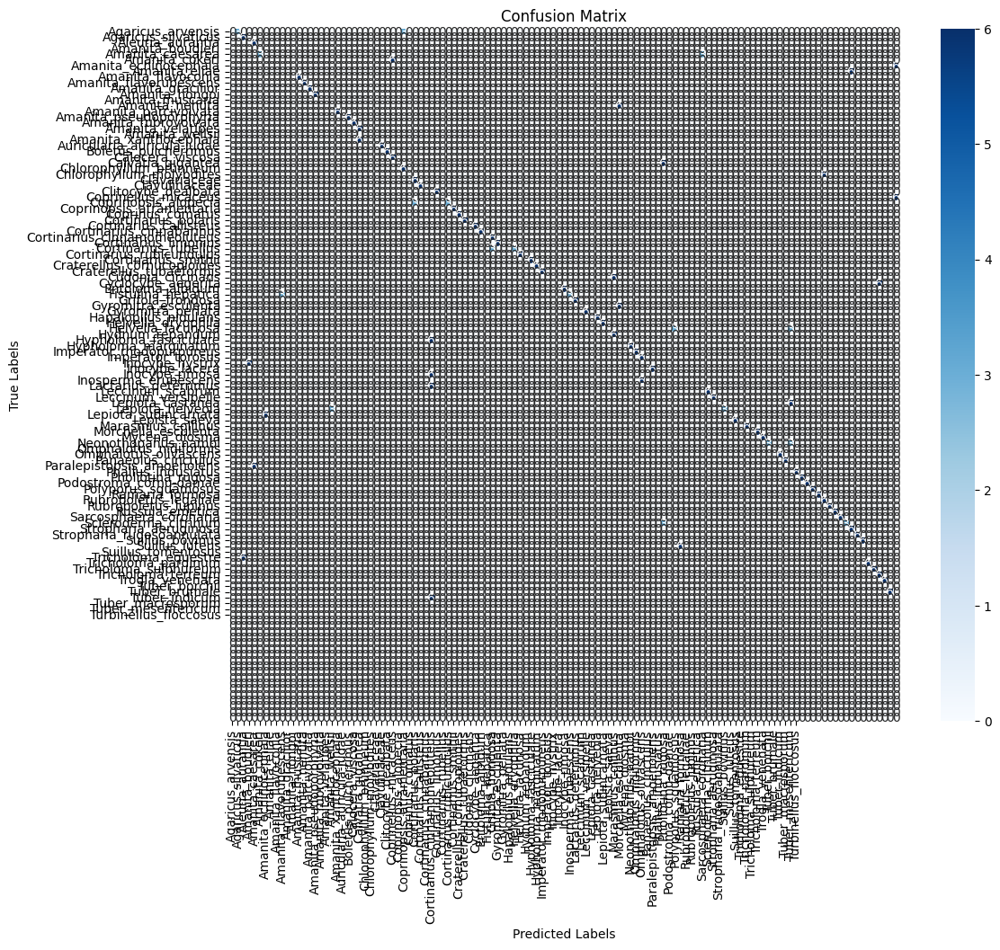

In [ ]:
import seaborn as sns

# Plot confusion matrix
conf_mat = confusion_matrix(y_true, y_pred_classes)
plt.figure(figsize=(16, 12))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues',
            xticklabels=eval_generator.class_indices.keys(),
            yticklabels=eval_generator.class_indices.keys())
plt.title('Confusion Matrix', fontsize=20)
plt.xlabel('Predicted Class', fontsize=18)
plt.ylabel('True Class', fontsize=18)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

In [ ]:
from sklearn.metrics import roc_auc_score

# Calculate AUC per class (only for binary or multilabel cases)
if len(class_labels) == 2:  # For binary classification
    auc_score = roc_auc_score(y_true, y_pred_prob[:, 1])
else:
    auc_scores = roc_auc_score(test_generator.classes, y_pred_prob, multi_class='ovr')

print(f"AUC Score per class: {auc_scores}")

AUC Score per class: 0.9767356315105089


In [ ]:
print(report)

                              precision    recall  f1-score   support

           Agaricus_arvensis       0.82      0.79      0.81        39
           Agaricus_bisporus       0.74      0.70      0.72        53
       Agaricus_californicus       0.63      0.73      0.67        51
          Agaricus_hondensis       0.67      0.67      0.67        51
            Agaricus_menieri       0.58      0.72      0.64        54
           Agaricus_moelleri       0.65      0.69      0.67        52
     Agaricus_phaeolepidotus       0.80      0.61      0.69        33
         Agaricus_placomyces       0.61      0.79      0.69        29
         Agaricus_silvaticus       0.74      0.81      0.77        31
       Agaricus_xanthodermus       0.91      0.76      0.83        38
          Agrocybe_arenicola       0.85      0.67      0.75        33
            Aleuria_aurantia       0.96      0.86      0.91        28
             Amanita_abrupta       0.44      0.69      0.54        26
          Amanita_a

In [ ]:
from sklearn.metrics import classification_report

# Get class labels from the generator
class_labels = list(test_generator.class_indices.keys())

# Generate a classification report, setting output_dict=True to get a dictionary
report = classification_report(y_true, y_pred, target_names=class_labels, output_dict=True)

# Print the report to see precision, recall, F1-score for each class
print(report)

{'Agaricus_arvensis': {'precision': 0.8157894736842105, 'recall': 0.7948717948717948, 'f1-score': 0.8051948051948052, 'support': 39.0}, 'Agaricus_bisporus': {'precision': 0.74, 'recall': 0.6981132075471698, 'f1-score': 0.7184466019417476, 'support': 53.0}, 'Agaricus_californicus': {'precision': 0.6271186440677966, 'recall': 0.7254901960784313, 'f1-score': 0.6727272727272727, 'support': 51.0}, 'Agaricus_hondensis': {'precision': 0.6666666666666666, 'recall': 0.6666666666666666, 'f1-score': 0.6666666666666666, 'support': 51.0}, 'Agaricus_menieri': {'precision': 0.582089552238806, 'recall': 0.7222222222222222, 'f1-score': 0.6446280991735537, 'support': 54.0}, 'Agaricus_moelleri': {'precision': 0.6545454545454545, 'recall': 0.6923076923076923, 'f1-score': 0.6728971962616822, 'support': 52.0}, 'Agaricus_phaeolepidotus': {'precision': 0.8, 'recall': 0.6060606060606061, 'f1-score': 0.6896551724137931, 'support': 33.0}, 'Agaricus_placomyces': {'precision': 0.6052631578947368, 'recall': 0.79310

In [ ]:
# Loop through each key-value pair in report, excluding "accuracy" or overall metrics
for class_name, metrics in report.items():
    if isinstance(metrics, dict) and 'precision' in metrics:
        precision = metrics['precision']
        class_precision_scores[class_name] = precision

# Identify classes with precision lower than 80%
low_precision_classes = [class_name for class_name, precision in class_precision_scores.items() if precision < 0.70]
print("Classes with precision < 70%:", low_precision_classes)

Classes with precision < 70%: ['Agaricus_californicus', 'Agaricus_hondensis', 'Agaricus_menieri', 'Agaricus_moelleri', 'Agaricus_placomyces', 'Amanita_abrupta', 'Amanita_albocreata', 'Amanita_arocheae', 'Amanita_bisporigera', 'Amanita_breckonii', 'Amanita_citrina', 'Amanita_cothurnata', 'Amanita_exitialis', 'Amanita_frostiana', 'Amanita_fuliginea', 'Amanita_fulva', 'Amanita_gemmata', 'Amanita_heterochroma', 'Amanita_ibotengutake', 'Amanita_neoovoidea', 'Amanita_ocreata', 'Amanita_pantherina', 'Amanita_parvipantherina', 'Amanita_petalinivolva', 'Amanita_pseudoregalis', 'Amanita_pseudorubescens', 'Amanita_regalis', 'Amanita_rubescens', 'Amanita_smithiana', 'Amanita_sphaerobulbosa', 'Amanita_subfrostiana', 'Amanita_subjunquillea', 'Amanita_subpallidorosea', 'Amanita_verna', 'Amanita_virosa', 'Amanita_viscidolutea', 'Ampulloclitocybe_clavipes', 'Armillaria_mellea', 'Calocybe_gambosa', 'Cantharellus_cibarius', 'Chroogomphus', 'Clitocybe_cerussata', 'Clitocybe_nebularis', 'Clitocybe_rivulosa

In [ ]:
import os
import shutil

# Loop through the list of low-precision classes and delete their directories
for class_name in low_precision_classes:
    class_path = os.path.join(data_dir, class_name)
    if os.path.exists(class_path):
        shutil.rmtree(class_path)
        print(f"Removed class directory: {class_path}")
    else:
        print(f"Class directory not found: {class_path}")

Removed class directory: /content/drive/My Drive/Mushroom/data/acd/Agaricus_californicus
Removed class directory: /content/drive/My Drive/Mushroom/data/acd/Agaricus_hondensis
Removed class directory: /content/drive/My Drive/Mushroom/data/acd/Agaricus_menieri
Removed class directory: /content/drive/My Drive/Mushroom/data/acd/Agaricus_moelleri
Removed class directory: /content/drive/My Drive/Mushroom/data/acd/Agaricus_placomyces
Removed class directory: /content/drive/My Drive/Mushroom/data/acd/Amanita_abrupta
Removed class directory: /content/drive/My Drive/Mushroom/data/acd/Amanita_albocreata
Removed class directory: /content/drive/My Drive/Mushroom/data/acd/Amanita_arocheae
Removed class directory: /content/drive/My Drive/Mushroom/data/acd/Amanita_bisporigera
Removed class directory: /content/drive/My Drive/Mushroom/data/acd/Amanita_breckonii
Removed class directory: /content/drive/My Drive/Mushroom/data/acd/Amanita_citrina
Removed class directory: /content/drive/My Drive/Mushroom/dat

In [ ]:
import os

dataset_dir = '/content/drive/My Drive/Mushroom/data/acd'

# List all directories in the dataset directory
directories = [d for d in os.listdir(dataset_dir) if os.path.isdir(os.path.join(dataset_dir, d))]

# Count the directories
num_directories = len(directories)
print(f"Number of directories in '{dataset_dir}': {num_directories}")

Number of directories in '/content/drive/My Drive/Mushroom/data/acd': 103


In [ ]:
from tensorflow.keras.models import load_model
model = load_model('/content/drive/MyDrive/Mushroom/mushroom_model.h5')

In [ ]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)                    │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 256)                 │       6,422,784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 133)                 │          34,181 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,550,215 (24.99 MB)

 Trainable params: 6,550,213 (24.99 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)